# Visualizing what Convolutional Neural Networks learn

There are several techniques for visualizing and interpreting these representations:

- `Visualizing intermediate convolutional outputs` (intermediate activations): Useful for understanding how successive layers transform their input and for getting a first idea of the meaning of individual filters.

- `Visualizing the filters`: Useful for understanding precisely what visual pattern or concept each filter in a convolutional network is receptive to. 

- `Visualizing heatmaps of class activation in an image`: Useful for understanding which parts of an image belong to a given class. It allows us to localize objects in images.

In [1]:
import numpy as np
import plotly.express as px
import plotly.io as pio
from PIL import Image
from plotly.subplots import make_subplots
pio.renderers.default = "plotly_mimetype+notebook_connected"

In [2]:
import tensorflow as tf

from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

import cv2      # For superimposing the heatmap with the original picture

## Visualizing intermediate activations

Visualizing intermediate activations consists of plotting the feature maps that are output by convolution and pooling layers in a network, given a specific input. The layer's output is the `activation`. Displaying activations gives us an idea of how an input image is decomposed into the different filters learned by the network. 

The feature maps have three dimensions: width, height, and channels. Each channel encodes moderately independent features. We can visualize the feature maps by independently plotting every channel's contents as a 2D image. 

We are going to use the model we saved in the last notebook.

In [3]:
# Load the model
model = load_model('model_cats_and_dogs.h5')
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 14, 14, 128)     

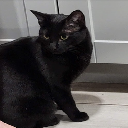

In [4]:
# Getting a picture of a cat, not part of the images the network was trained on
cat_path = 'Cat1.png'
cat = image.load_img(cat_path, target_size=(128, 128))
cat

In [5]:
def plot_image(img, ccs='Viridis', title=''):
    '''
    Plot an image
    '''
    fig = px.imshow(img, width=400, height=400, 
                    color_continuous_scale=ccs, title=title)
    # Remove the x-axis and y-axis
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)    
    fig.show()


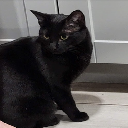

In [6]:
plot_image(cat, title='Original Image')

In [7]:
cat_tensor = image.img_to_array(cat)
cat_tensor = np.expand_dims(cat_tensor, axis=0)
cat_tensor /= 255.
cat_tensor.shape

(1, 128, 128, 3)

To extract the feature maps, we will create a Keras model that takes batches of images as input and outputs the activations of all convolution and pooling layers. 

To do this, we will use the Keras class `Model`. 

A model is instantiated using two arguments: an input tensor (or list of input tensors) and an output tensor (or list of output tensors). The resulting class is a Keras model, just like the Sequential models, mapping the specified inputs to the specified outputs.

In [8]:
from tensorflow.keras.models import Model

In [9]:
# Extract the outputs of the top six layers
layer_outputs = [layer.output for layer in model.layers[:6]]
layer_outputs

[<KerasTensor: shape=(None, 126, 126, 32) dtype=float32 (created by layer 'conv2d_2')>,
 <KerasTensor: shape=(None, 63, 63, 32) dtype=float32 (created by layer 'max_pooling2d_2')>,
 <KerasTensor: shape=(None, 61, 61, 64) dtype=float32 (created by layer 'conv2d_3')>,
 <KerasTensor: shape=(None, 30, 30, 64) dtype=float32 (created by layer 'max_pooling2d_3')>,
 <KerasTensor: shape=(None, 28, 28, 128) dtype=float32 (created by layer 'conv2d_4')>,
 <KerasTensor: shape=(None, 14, 14, 128) dtype=float32 (created by layer 'max_pooling2d_4')>]

In [10]:
# Creates a model that will return these outputs, given the model input
activation_model = Model(inputs=model.input, outputs=layer_outputs)

When fed an image input, this model returns the values of the layer activations in the original model. 

Generally, a model can have any number of inputs and outputs. This one has one input and six outputs: one output per layer activation.

Running the model in predict mode:

In [11]:
# Returns a list of NumPy arrays: one array per layer activation
activations = activation_model.predict(cat_tensor)

1/1 [==============================] - 0s 112ms/step


In [12]:
# Verifying "activations" has 6 outputs (layer activations)
len(activations)

6

In [13]:
# Shape of each layer activation
for act in range(len(activations)):
    print('Layer Activation', act, activations[act].shape)

Layer Activation 0 (1, 126, 126, 32)
Layer Activation 1 (1, 63, 63, 32)
Layer Activation 2 (1, 61, 61, 64)
Layer Activation 3 (1, 30, 30, 64)
Layer Activation 4 (1, 28, 28, 128)
Layer Activation 5 (1, 14, 14, 128)


In [14]:
# First layer activation is a 126x126 feature map with 32 channels
first_layer_activation = activations[0]
first_layer_activation.shape

(1, 126, 126, 32)

In [15]:
plot_image(first_layer_activation[0, :, :, 2], ccs='ice', title='Channel 2 - First Layer')

In [16]:
plot_image(first_layer_activation[0, :, :, 11], ccs='ice', title='Channel 11 - First Layer')

In [17]:
# Visualizing all channels of the first layer
rows = 4
cols = 8

# Create a subplot figure
fig = make_subplots(rows=rows, cols=cols)

# Visualizing some channels of the first layer
for i in range(rows * cols):
    channel_data = first_layer_activation[0, :, :, i]
    channel_data_flipped = np.flipud(channel_data)  # Flip the channel data vertically
    fig.add_trace(px.imshow(channel_data_flipped).data[0],
                  row=i // cols + 1, col=i % cols + 1)

# Remove the x-axis and y-axis
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

# Set the figure size
fig.update_layout(title="Channels of the First Layer",
                  title_font_size=16, width=800, height=500)

# Show the plot
fig.show()

As you can see, the first layer is a collection of several edge detectors. 

The activations retain a lot of the information present in the initial picture.

Let's create a function for visualizing the first `rows x cols` channels of a layer.

In [18]:
def plot_channels(layer, rows=4, cols=8, title=''):
    '''
    Visualize the first rows x cols channels of the layer
    '''
    # Create a subplot figure
    fig = make_subplots(rows=rows, cols=cols)

    # Visualizing some the first channels 
    for i in range(rows * cols):
        channel_data = layer[0, :, :, i]
        channel_data_flipped = np.flipud(channel_data)  # Flip the channel data vertically
        fig.add_trace(px.imshow(channel_data_flipped).data[0],
                    row=i // cols + 1, col=i % cols + 1)

    # Remove the x-axis and y-axis
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)

    # Set the figure size
    fig.update_layout(title=title, title_font_size=16, width=800, height=500)

    # Show the plot
    fig.show()

In [19]:
# Second layer activation is a 63x63 feature map with 32 channels
second_layer_activation = activations[1]
second_layer_activation.shape

(1, 63, 63, 32)

In [20]:
plot_channels(second_layer_activation, 4, 8, 'Channels of the Second Layer')

In [21]:
# Sixth layer activation is a 14x14 feature map with 128 channels
sixth_layer_activation = activations[5]
sixth_layer_activation.shape

(1, 14, 14, 128)

In [22]:
plot_channels(sixth_layer_activation, 4, 8, '32 First Channels of the Sixth Layer')

The last layer is very abstract and not so easily interpretable. 

The features extracted by a layer become increasingly abstract with the depth of the layer. 

The activations of higher layers carry less and less information about the specific input being seen and more and more information about the target, the cat in our case. 

## Visualizing the filters

In [23]:
# Getting the layers of the model
model.layers

In [24]:
# Extract the filter weights of the first layer
filters1 = model.layers[0].get_weights()[0] 
filters1.shape

(3, 3, 3, 32)

 The dimensions of `(3, 3, 3)` indicate that each filter is a `3x3` kernel with `3` channels (e.g., Red, Green, and Blue) in an RGB image. The last dimension of `32` suggests that you have a total of `32` filters in that specific layer.

 Let's create a function for visualizing the the first `rows x cols` filters (first channel) used in a layer.

In [25]:
def plot_filters(filters, rows=4, cols=8, channel=0, title=''):
    '''
    Visualize the first rows x cols filters of the first channel
    '''
    # Create a subplot figure
    fig = make_subplots(rows=rows, cols=cols)

    # Visualizing the first filters
    for i in range(rows * cols):
        channel_data = filters[:, :, channel, i]
        channel_data_flipped = np.flipud(channel_data)  # Flip the channel data vertically
        fig.add_trace(px.imshow(channel_data_flipped).data[0],
                    row=i // cols + 1, col=i % cols + 1)

    # Remove the x-axis and y-axis
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)

    # Set the figure size
    fig.update_layout(title=title, title_font_size=16, width=800, height=500)

    # Show the plot
    fig.show()

In [26]:
# Visualizing the channel 0 of 32 filters of the first layer
plot_filters(filters1, 4, 8, 0, 'Channel 0 of 32 Filters of the First Layer')

In [27]:
# Visualizing the channel 1 of 32 filters of the first layer
plot_filters(filters1, 4, 8, 1, 'Channel 1 of 32 Filters of the First Layer')

In [28]:
# Visualizing the channel 2 of 32 filters of the first layer
plot_filters(filters1, 4, 8, 2, 'Channel 2 of 32 Filters of the First Layer')

Remember, filters in a CNN are not necessarily interpretable as images, especially in the deeper layers. Filters in the first layer usually act as edge filters; sometimes, we can visualize them as images. For deeper layers, each filter represents a more abstract feature of the input data, and it can be hard to interpret what precisely each filter is "looking for."

In [29]:
# Get the weights of another layer of the model
filters2 = model.layers[4].get_weights()[0]
filters2.shape

(3, 3, 64, 128)

In [30]:
# Visualizing the channel 0 of 32 filters of the layer
plot_filters(filters2, 4, 8, 0, 'Channel 0 of 32 Filters of a CNN Layer')

## Visualizing heatmaps of class activation

Visualizing heatmaps of class activation is helpful for understanding which parts of a given image led a convnet to its final classification decision. It produces heatmaps of class activation over input images, indicating how important each location is concerning the class under consideration.

We will use the Grad-CAM technique (Gradient Class Activation Map) to visualize the heatmap. 

The idea behind it is: to find the importance of a specific class in our model, we take its gradient for the final convolutional layer and then weigh it against the output of this layer.

For example, given an image fed into our cats versus dogs convolutional network, Grad-CAM visualization allows us to generate a heatmap for the class "cat," indicating how cat-like different parts of the image are, and also a heatmap for the class "dog," showing how dog-like parts of the image are. 

In [31]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 28, 28, 128)       73856     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 14, 14, 128)     

The purpose is to know what parts of the image allow the network to classify it as a cat.


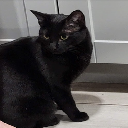

In [32]:
plot_image(cat, title='Original Image')

In [33]:
class_cats_and_dogs = ['Cat', 'Dog']

In [34]:
# Getting the model prediction
pred = model.predict(cat_tensor)
val = int(pred[0].round(0))
print('Class prediction =', class_cats_and_dogs[val])

1/1 [==============================] - 0s 167ms/step
Class prediction = Cat


In [35]:
def get_tensor(img_path):
    '''
    Load and preprocess the image. It returns the image as a tensor.
    '''
    img = image.load_img(img_path, target_size=(128, 128))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.
    return img_tensor

In [36]:
cat_tensor = get_tensor(cat_path)
print('cat shape =', np.array(cat).shape)
print('cat_tensor shape =', cat_tensor.shape)

cat shape = (128, 128, 3)
cat_tensor shape = (1, 128, 128, 3)


Let's set up the Grad-CAM process to visualize which parts of the image are the most cat–like.

In [37]:
# Getting the layers names (We will need the last convolutional layer)
[layer.name for layer in model.layers]

['conv2d_2',
 'max_pooling2d_2',
 'conv2d_3',
 'max_pooling2d_3',
 'conv2d_4',
 'max_pooling2d_4',
 'flatten_1',
 'dense_2',
 'dense_3']

In [38]:
def get_heatmap(img_tensor, img_class=0):
    '''
    It uses the Gradient Class Activation Map technique to get the heatmap.    
    '''   
    # Get the last convolutional layer
    last_conv_layer = model.get_layer('conv2d_4')
    # Get the gradient of the img_class with regard to the output feature map of last_conv_layer
    grad_model = Model(inputs=[model.inputs], outputs=[last_conv_layer.output, model.output])
    conv_outputs, predictions = grad_model(img_tensor)
    predicted_class = np.argmax(predictions[0])
    # Compute the gradients of the predicted class with respect to the output feature maps
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_tensor)
        loss = predictions[:, predicted_class]
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    # Compute the heatmap by multiplying the gradients with the output feature maps
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    heatmap = heatmap[0]
    return heatmap

In [39]:
heatmap = get_heatmap(cat_tensor, 0)
plot_image(heatmap, ccs='icefire', title='Heatmap') 

Let's create a function for superimposing the heatmap with the original picture.

In [40]:
def visualize_heatmap(img_path):
    '''
    
    '''
    # Loading the image
    img = image.load_img(img_path, target_size=(128, 128))
    
    # Getting the image tensor
    img_tensor = get_tensor(img_path)
    
    # Predicting the class
    pred = model.predict(img_tensor, verbose=0)
    
    # Getting the class index
    img_class = pred[0][0].round(0).astype('int')
    
    # Getting the heatmap
    heatmap = get_heatmap(img_tensor, img_class)    
    
    # Resizes the heatmap to be the same size as the original image
    heatmap = cv2.resize(heatmap, (128, 128))
        
    # Apply colormap to the heatmap
    heatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_PLASMA)
        
    # 0.5 here is a heatmap intensity factor
    superimposed_img = heatmap * 0.8 + img
    cv2.imwrite('tmp.jpg', superimposed_img)
    
    # Getting the superimposed image
    superimposed_img = image.load_img('tmp.jpg')

    # Plotting the results
    fig = make_subplots(rows=1, cols=2)
    fig.add_trace(px.imshow(img).data[0], row=1, col=1)    
    fig.add_trace(px.imshow(superimposed_img).data[0], row=1, col=2)
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False) 
    fig.update_layout(title='Class = ' + class_cats_and_dogs[img_class], 
                      width=600, height=400)
    fig.show()     


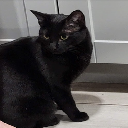
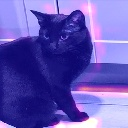

In [41]:
visualize_heatmap(cat_path)


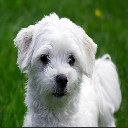
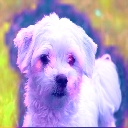

In [42]:
visualize_heatmap('Dog1.png')


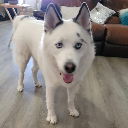
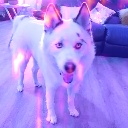

In [43]:
visualize_heatmap('Dog2.png')


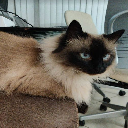
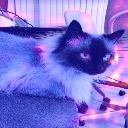

In [44]:
visualize_heatmap('HCat.jpg')

## References

- Chollet, F. (2021) ***Deep Learning with Python***, Manning Publications Co, topics 5.4
- Ramprasaath R. S. et. al (2016) Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization, [https://arxiv.org/pdf/1610.02391.pdf]